In [1]:
%matplotlib inline
%config InlineBackend.figure_format='svg'

import pandas as pd
from datetime import datetime, timedelta

import seaborn as sns
sns.set()

import matplotlib.pyplot as plt
#import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
import mysql.connector
import numpy as np

from scipy.signal import savgol_filter   # smooth the data

#plt.style.use('seaborn-white')
plt.style.use('seaborn-white')

In [17]:
pdr = pd.read_csv( "https://raw.githubusercontent.com/ClarksonAirlab/2019_sensor_workshop/master/Python/Tutorial/Tutorial%20Data/pDR_2_20190805_1.csv")
HW1 = pd.read_csv("https://raw.githubusercontent.com/ClarksonAirlab/2019_sensor_workshop/master/Python/Tutorial/Tutorial%20Data/argon24.csv")
HW2 = pd.read_csv("https://raw.githubusercontent.com/ClarksonAirlab/2019_sensor_workshop/master/Python/Tutorial/Tutorial%20Data/argon44.csv")

pdr["DateTime"] = pdr["date"] + pdr["time"]
pdr["DateTime"] = pd.to_datetime(pdr["DateTime"])

pdr.index=pdr['DateTime']


cols = pdr.columns[pdr.dtypes.eq('object')]
pdr[cols] = pdr[cols].apply(pd.to_numeric,errors = 'coerce')
pdr.info()

HW1.columns = ["DateTime","id","pm2.5hw1","pm10","Temp","RH"]
HW2.columns = ["DateTime","id","pm2.5hw2","pm10","Temp","RH"]
HW1["DateTime"] = pd.to_datetime(HW1["DateTime"])
HW2["DateTime"] = pd.to_datetime(HW2["DateTime"])

HW1.index=HW1['DateTime']
HW2.index=HW2['DateTime']

HW1=HW1.sort_values('id')
HW2=HW2.sort_values('id')


pdr=pdr['2019-08-05 13:26:00':'2019-08-06 07:50:00']
HW1=HW1['2019-08-05 13:26:00':'2019-08-06 07:50:00']
HW2=HW2['2019-08-05 13:26:00':'2019-08-06 07:50:00']

pdr.index=pdr['DateTime']



<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 70007 entries, 2019-08-05 12:23:32 to 2019-08-06 07:50:18
Data columns (total 8 columns):
pm2.5            70001 non-null float64
 Temp            70001 non-null float64
 RHumidity       70001 non-null float64
 AtmoPressure    70001 non-null float64
 Flags           70001 non-null float64
time             0 non-null float64
date             0 non-null float64
DateTime         70001 non-null datetime64[ns]
dtypes: datetime64[ns](1), float64(7)
memory usage: 4.8 MB


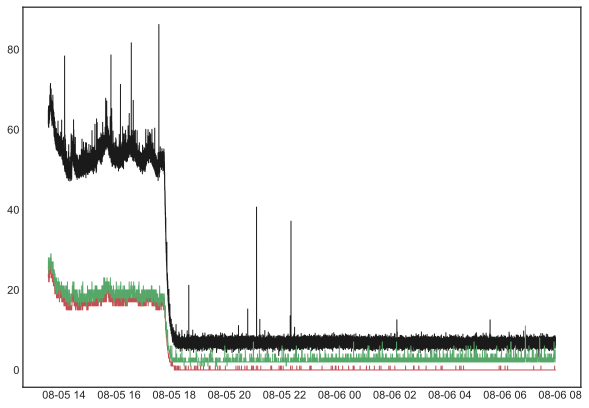

In [18]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(pdr['DateTime'],pdr['pm2.5'], color='k',linewidth=1,label='grimm Raw data')

ax1.plot(HW1['DateTime'],HW1['pm2.5hw1'], color='r',linewidth=1,label='grimm Raw data')
ax1.plot(HW2['DateTime'],HW2['pm2.5hw2'], color='g',linewidth=1,label='grimm Raw data')


In [19]:

pdrn=pdr.resample('5s').mean()


In [20]:
pdrn=pdrn.reset_index()


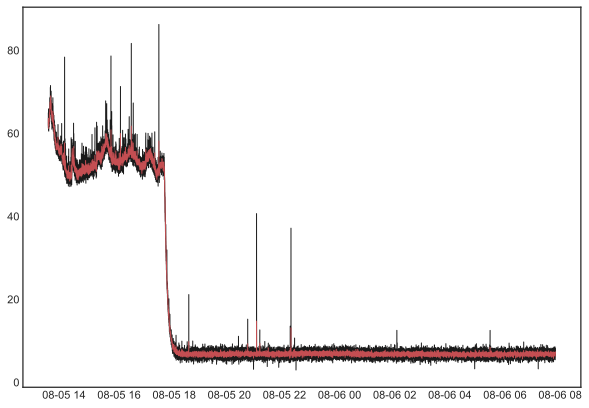

In [21]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(pdr['DateTime'],pdr['pm2.5'], color='k',linewidth=1,label='grimm Raw data')
ax1.plot(pdrn['DateTime'],pdrn['pm2.5'], color='r',linewidth=1,label='grimm Raw data')




In [22]:
HW1=HW1.drop(['DateTime'], axis=1)


In [23]:
HW1=HW1.reset_index()


In [24]:
HW2=HW2.drop(['DateTime'], axis=1)
HW2=HW2.reset_index()


In [25]:


df = pd.merge_asof(pdrn,HW1[['DateTime','pm2.5hw1']], on='DateTime', tolerance=pd.Timedelta("5 minutes"), direction='nearest').fillna('NaN')
df = pd.merge_asof(df,HW2[['DateTime','pm2.5hw2']], on='DateTime', tolerance=pd.Timedelta("5 minutes"), direction='nearest').fillna('NaN')


In [28]:
plt.figure(figsize=(10,8))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


plt.scatter(df['pm2.5hw1'],df['pm2.5'], color= 'k',alpha=0.9,label='hw1')
plt.scatter(df['pm2.5hw2'],df['pm2.5'], color= 'r',alpha=0.9,label='hw2')


plt.legend( loc='best',fontsize=17)

plt.title("Test with PDR", fontsize=16)
plt.ylabel('PDR pm2.5',fontsize=16,color='k',labelpad=13)
plt.xlabel('Honeywell pm2.5',fontsize=16,color='k',labelpad=13)

#plt.show()
#plt.savefig('books_read.png',dpi=300)

Text(0.5, 0, 'Honeywell pm2.5')

In [29]:
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [33]:
df['pdr']=df['pm2.5']
df['hw1']=df['pm2.5hw1']

In [34]:
results = smf.ols('pdr ~ hw1', data=df).fit()

In [35]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                    pdr   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                 3.436e+06
Date:                Tue, 06 Aug 2019   Prob (F-statistic):               0.00
Time:                        23:23:33   Log-Likelihood:                -21533.
No. Observations:               13249   AIC:                         4.307e+04
Df Residuals:                   13247   BIC:                         4.308e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      6.8350      0.012    559.634      0.0

In [36]:
df['chw1']=df['hw1']*2.6652+6.8350

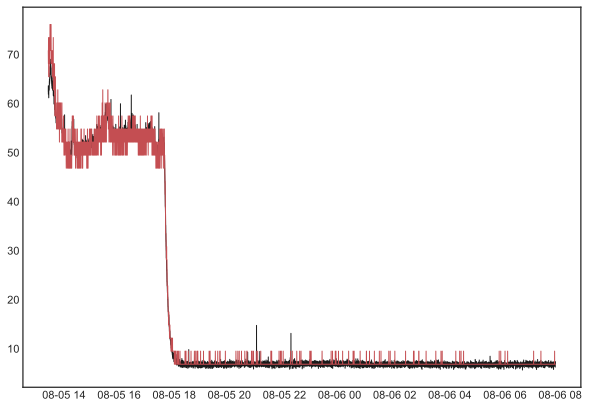

In [37]:
fig, ax1 = plt.subplots()
fig.set_size_inches(10, 7)
ax1.grid(False)


ax1.plot(df['DateTime'],df['pdr'], color='k',linewidth=1,label='PDR')

ax1.plot(df['DateTime'],df['chw1'], color='r',linewidth=1,label='chw1')


Text(0.5, 0, 'Honeywell pm2.5')

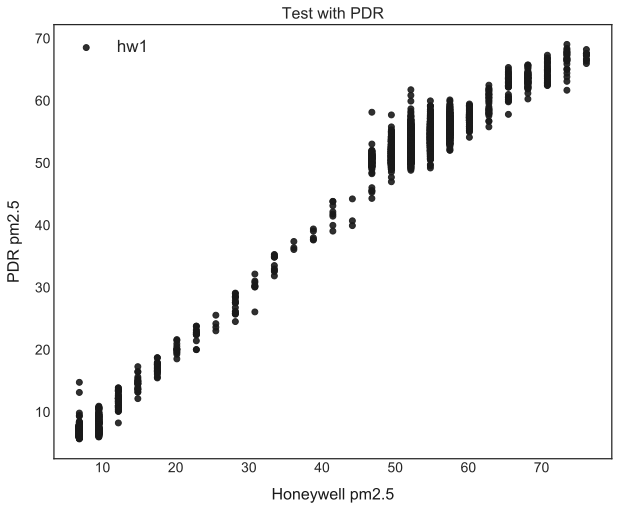

In [38]:
plt.figure(figsize=(10,8))

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


plt.scatter(df['chw1'],df['pdr'], color= 'k',alpha=0.9,label='hw1')


plt.legend( loc='best',fontsize=17)

plt.title("Test with PDR", fontsize=16)
plt.ylabel('PDR pm2.5',fontsize=16,color='k',labelpad=13)
plt.xlabel('Honeywell pm2.5',fontsize=16,color='k',labelpad=13)

#plt.show()
#plt.savefig('books_read.png',dpi=300)

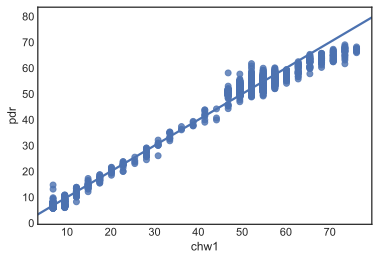

In [39]:
import seaborn as sns
ax = sns.regplot(x="chw1", y="pdr", data=df)